In [8]:
!pip install pandas matplotlib seaborn

In [15]:
# Step 1: Load and Preview the Data

# Essential imports for tennis data analysis and visualization

import pandas as pd        # Data loading and manipulation
import numpy as np         # Numerical operations
import matplotlib.pyplot as plt  # Core plotting library
import seaborn as sns      # Statistical and beautiful plots

# Load the dataset
# Make sure the CSV file is in the same directory as this notebook

df = pd.read_csv('roland_garros_finals_2000_2025.csv')

display(df.head())
display(df.tail())
print(df.info())
print(df.isnull().sum())

,date,champion,runner_up,seed_champion,seed_runner_up,score,duration,aces_champion,aces_runner_up,df_champion,...,tot_points_champion,tot_points_runner_up,break_saved_champion,break_saved_runner_up,return_games_champion,return_games_runner_up,total_games_champion,total_games_runner_up,match_points_saved,umpire
0,2000,Gustavo Kuerten,Magnus Norman,5,3,"6-2, 6-3, 2-6, 7-6(8-6)",2:38,12,10,3,...,134,120,6/8,4/10,5,4,27,24,NaN,Andreas Egli
1,2001,Gustavo Kuerten,Alex Corretja,1,13,"6-7(3-7), 7-5, 6-2, 6-0",3:12,15,7,5,...,143,116,7/10,3/8,7,3,31,25,1.0,Michel Perlmutter
2,2002,Albert Costa,Juan Carlos Ferrero,20,11,"6-1, 6-0, 4-6, 6-3",2:52,6,8,2,...,120,110,5/7,4/9,6,2,27,23,NaN,Michel Perlmutter
3,2003,Juan Carlos Ferrero,Martin Verkerk,3,NL,"6-1, 6-3, 6-2",1:45,7,12,1,...,98,84,4/5,2/6,5,1,23,18,NaN,Andreas Egli
4,2004,Gaston Gaudio,Guillermo Coria,44,3,"0-6, 3-6, 6-4, 6-1, 8-6",3:31,6,11,4,...,150,145,8/13,7/15,7,6,34,33,2.0,Carlos Ramos


,date,champion,runner_up,seed_champion,seed_runner_up,score,duration,aces_champion,aces_runner_up,df_champion,...,tot_points_champion,tot_points_runner_up,break_saved_champion,break_saved_runner_up,return_games_champion,return_games_runner_up,total_games_champion,total_games_runner_up,match_points_saved,umpire
21,2021,Novak Djokovic,Stefanos Tsitsipas,1,5,"6-7(6-8), 2-6, 6-3, 6-2, 6-4",4:11,8,10,3,...,180,170,9/12,7/14,9,7,41,39,1.0,Andreas Egli
22,2022,Rafael Nadal,Casper Ruud,5,8,"6-3, 6-3, 6-0",2:18,7,4,2,...,110,80,7/8,3/7,7,2,23,15,NaN,Gianluca Moscarella
23,2023,Novak Djokovic,Casper Ruud,3,4,"7-6(7-1), 6-3, 7-5",3:13,7,6,2,...,120,100,8/10,4/8,8,2,25,17,NaN,Aurélie Tourte
24,2024,Carlos Alcaraz,Alexander Zverev,3,4,"6-3, 2-6, 5-7, 6-1, 6-2",4:19,8,7,2,...,110,90,7/8,3/7,7,2,23,15,NaN,Damien Dumusois
25,2025-06-08,Carlos Alcaraz,Jannik Sinner,2,1,"4-6,6-7(4-7),6-4,7-6(7-3),7-6(10-2)",5:29,7,8,7,...,192,193,8/15,7/14,7,7,30,29,3.0,Eva Asderaki


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26 entries, 0 to 25
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   date                       26 non-null     object 
 1   champion                   26 non-null     object 
 2   runner_up                  26 non-null     object 
 3   seed_champion              26 non-null     int64  
 4   seed_runner_up             26 non-null     object 
 5   score                      26 non-null     object 
 6   duration                   26 non-null     object 
 7   aces_champion              26 non-null     int64  
 8   aces_runner_up             26 non-null     int64  
 9   df_champion                26 non-null     int64  
 10  df_runner_up               26 non-null     int64  
 11  first_serve_pct_champion   26 non-null     int64  
 12  first_serve_pct_runner_up  26 non-null     int64  
 13  first_win_pct_champion     26 non-null     int64  
 

In [16]:
# Show key columns for each final
basic_cols = ['date', 'champion', 'runner_up', 'score', 'duration', 'seed_champion', 'seed_runner_up']
display(df[basic_cols].tail(10))  # Show last 10 finals

# Calculate number of sets in each final
def count_sets(score):
    # Count how many comma-separated sets in the score string
    if pd.isnull(score):
        return None
    return len(str(score).split(','))

df['num_sets'] = df['score'].apply(count_sets)

# Add a column: 'straight_sets' (True if 3 sets, False otherwise)
df['straight_sets'] = df['num_sets'] == 3

# Add a column: 'five_sets' (True if 5 sets, False otherwise)
df['five_sets'] = df['num_sets'] == 5

# How many finals were straight sets? How many went 5 sets?
print("Straight-set finals:", df['straight_sets'].sum())
print("5-set finals:", df['five_sets'].sum())

# Which seeds won the title most often?
seed_counts = df['seed_champion'].value_counts().sort_index()
print("Titles by seed (champion):")
print(seed_counts)

,date,champion,runner_up,score,duration,seed_champion,seed_runner_up
16,2016,Novak Djokovic,Andy Murray,"3-6, 6-1, 6-2, 6-4",3:03,1,2
17,2017,Rafael Nadal,Stan Wawrinka,"6-2, 6-3, 6-1",2:05,4,3
18,2018,Rafael Nadal,Dominic Thiem,"6-4, 6-3, 6-2",2:42,1,7
19,2019,Rafael Nadal,Dominic Thiem,"6-3, 5-7, 6-1, 6-1",3:01,2,4
20,2020,Rafael Nadal,Novak Djokovic,"6-0, 6-2, 7-5",2:41,2,1
21,2021,Novak Djokovic,Stefanos Tsitsipas,"6-7(6-8), 2-6, 6-3, 6-2, 6-4",4:11,1,5
22,2022,Rafael Nadal,Casper Ruud,"6-3, 6-3, 6-0",2:18,5,8
23,2023,Novak Djokovic,Casper Ruud,"7-6(7-1), 6-3, 7-5",3:13,3,4
24,2024,Carlos Alcaraz,Alexander Zverev,"6-3, 2-6, 5-7, 6-1, 6-2",4:19,3,4
25,2025-06-08,Carlos Alcaraz,Jannik Sinner,"4-6,6-7(4-7),6-4,7-6(7-3),7-6(10-2)",5:29,2,1


Straight-set finals: 10
5-set finals: 4
Titles by seed (champion):
seed_champion
1     6
2     9
3     4
4     2
5     2
8     1
20    1
44    1
Name: count, dtype: int64


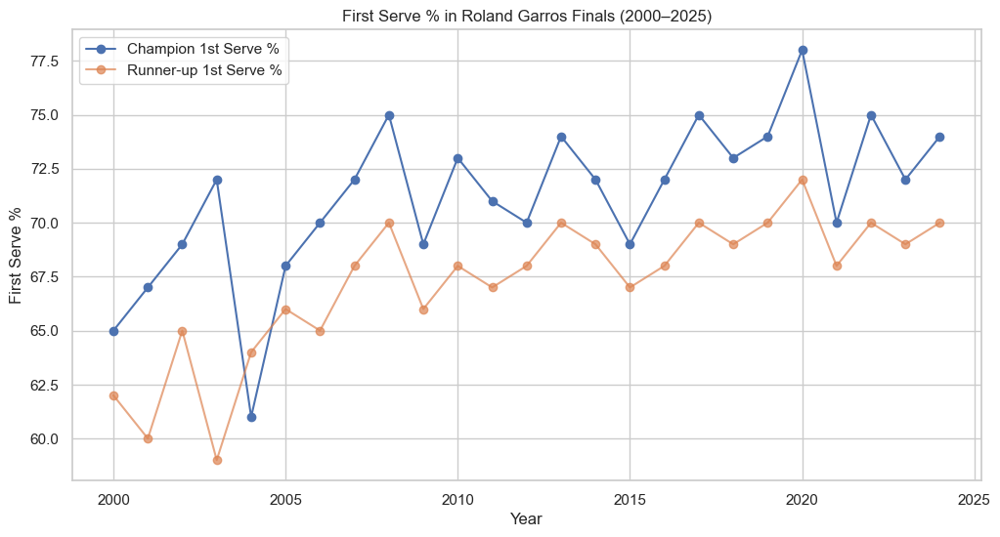

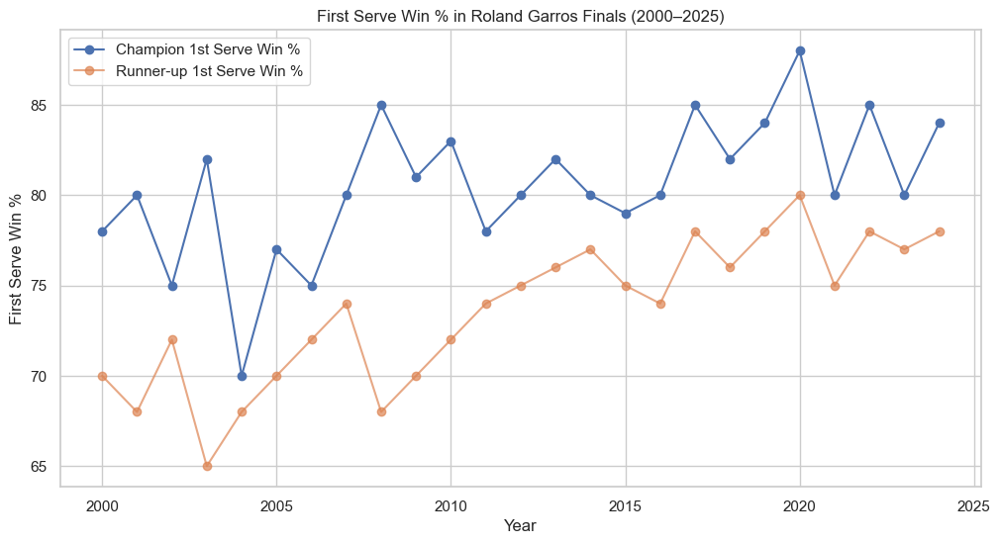

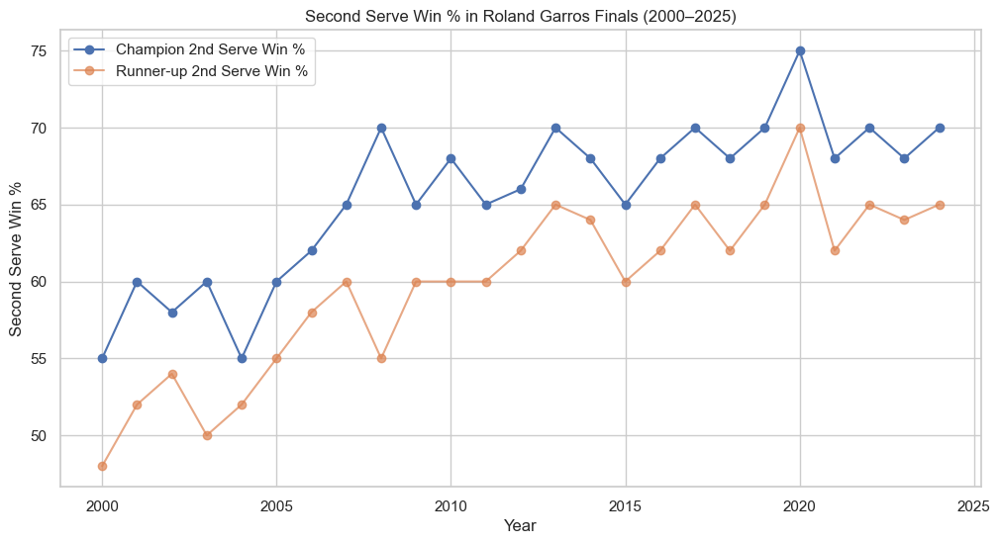

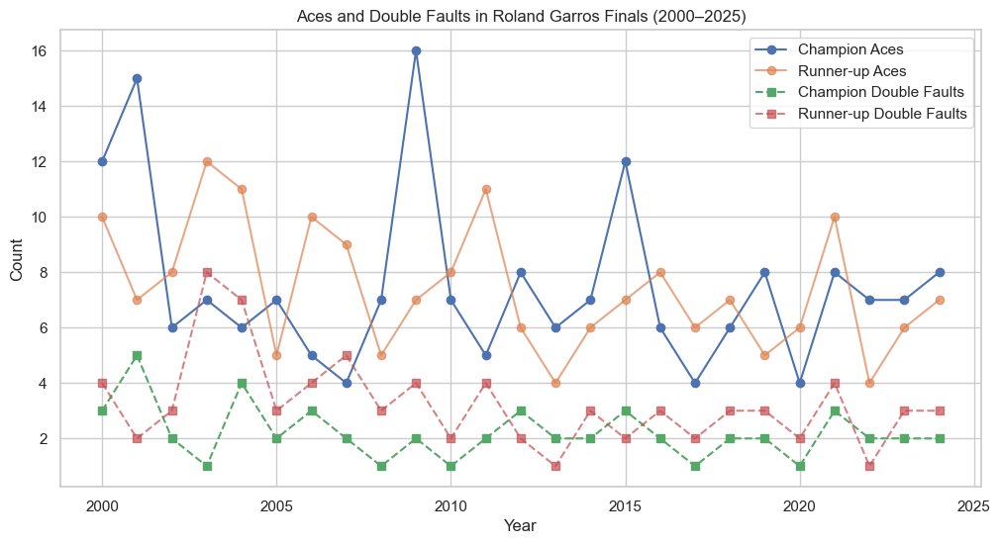

In [17]:
# Convert date to year for plotting
df['year'] = pd.to_datetime(df['date'], errors='coerce').dt.year

# Plot First Serve % (Champion and Runner-up) over time
plt.figure(figsize=(12,6))
plt.plot(df['year'], df['first_serve_pct_champion'], marker='o', label='Champion 1st Serve %')
plt.plot(df['year'], df['first_serve_pct_runner_up'], marker='o', label='Runner-up 1st Serve %', alpha=0.7)
plt.title('First Serve % in Roland Garros Finals (2000–2025)')
plt.xlabel('Year')
plt.ylabel('First Serve %')
plt.legend()
plt.show()

# Plot First Serve Win % (Champion and Runner-up) over time
plt.figure(figsize=(12,6))
plt.plot(df['year'], df['first_win_pct_champion'], marker='o', label='Champion 1st Serve Win %')
plt.plot(df['year'], df['first_win_pct_runner_up'], marker='o', label='Runner-up 1st Serve Win %', alpha=0.7)
plt.title('First Serve Win % in Roland Garros Finals (2000–2025)')
plt.xlabel('Year')
plt.ylabel('First Serve Win %')
plt.legend()
plt.show()

# Plot Second Serve Win % (Champion and Runner-up) over time
plt.figure(figsize=(12,6))
plt.plot(df['year'], df['second_win_pct_champion'], marker='o', label='Champion 2nd Serve Win %')
plt.plot(df['year'], df['second_win_pct_runner_up'], marker='o', label='Runner-up 2nd Serve Win %', alpha=0.7)
plt.title('Second Serve Win % in Roland Garros Finals (2000–2025)')
plt.xlabel('Year')
plt.ylabel('Second Serve Win %')
plt.legend()
plt.show()

# Plot Aces and Double Faults per final (Champion and Runner-up)
plt.figure(figsize=(12,6))
plt.plot(df['year'], df['aces_champion'], marker='o', label='Champion Aces')
plt.plot(df['year'], df['aces_runner_up'], marker='o', label='Runner-up Aces', alpha=0.7)
plt.plot(df['year'], df['df_champion'], marker='s', label='Champion Double Faults', linestyle='--')
plt.plot(df['year'], df['df_runner_up'], marker='s', label='Runner-up Double Faults', linestyle='--', alpha=0.7)
plt.title('Aces and Double Faults in Roland Garros Finals (2000–2025)')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend()
plt.show()

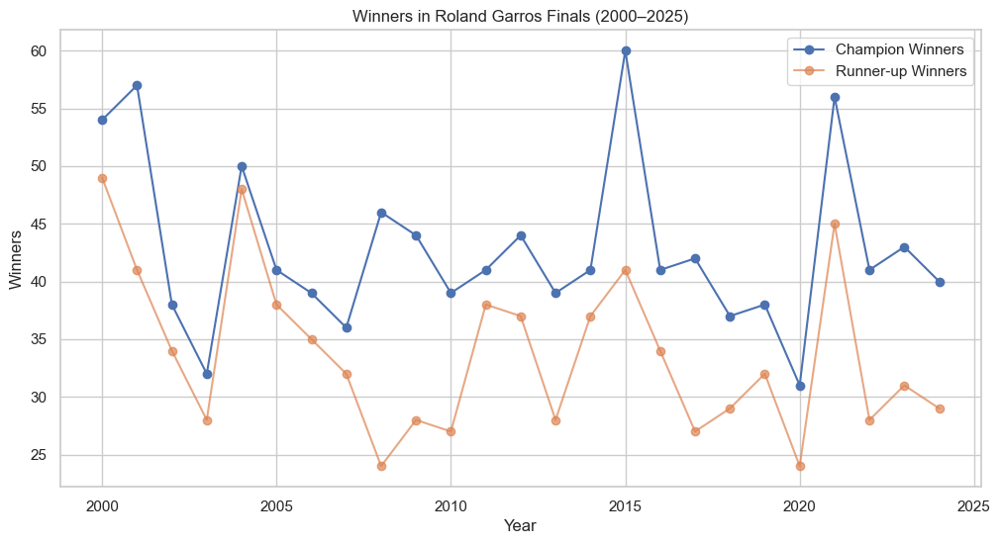

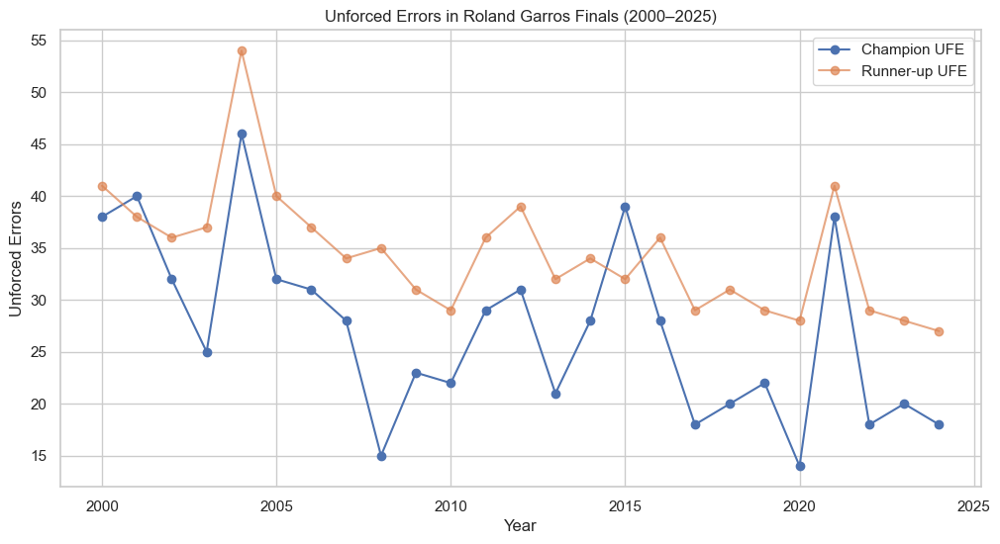

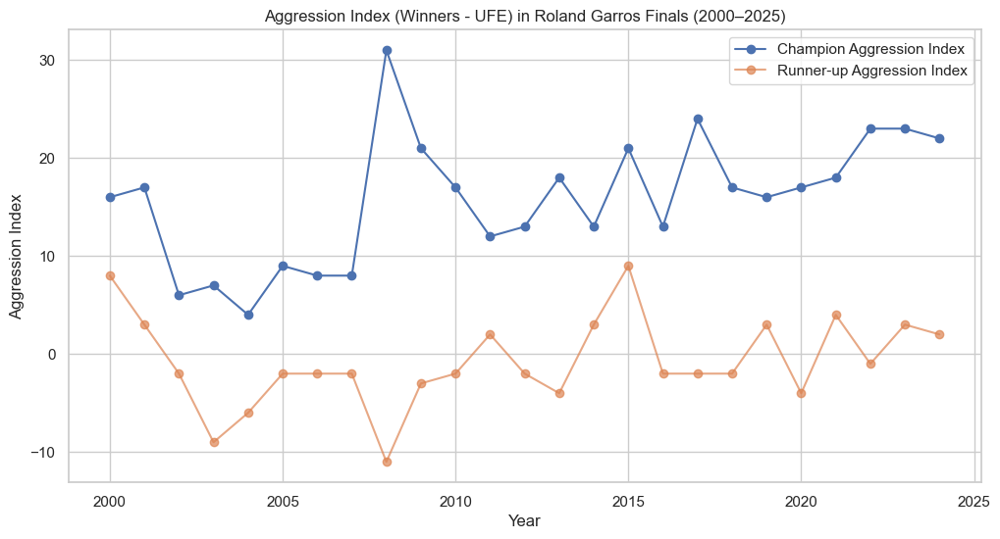

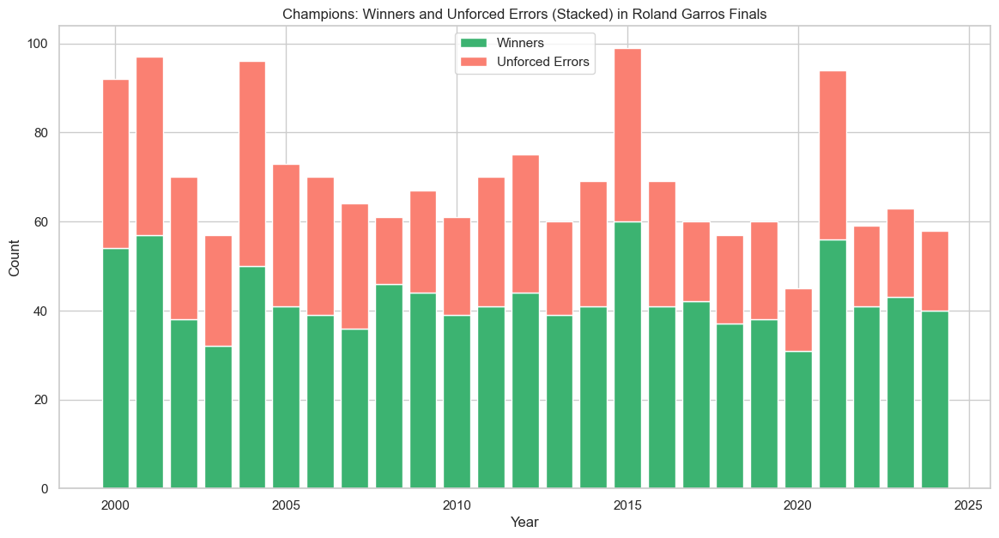

In [18]:
# Plot Winners per final (Champion and Runner-up) over time
plt.figure(figsize=(12,6))
plt.plot(df['year'], df['winners_champion'], marker='o', label='Champion Winners')
plt.plot(df['year'], df['winners_runner_up'], marker='o', label='Runner-up Winners', alpha=0.7)
plt.title('Winners in Roland Garros Finals (2000–2025)')
plt.xlabel('Year')
plt.ylabel('Winners')
plt.legend()
plt.show()

# Plot Unforced Errors per final (Champion and Runner-up) over time
plt.figure(figsize=(12,6))
plt.plot(df['year'], df['uf_errors_champion'], marker='o', label='Champion UFE')
plt.plot(df['year'], df['uf_errors_runner_up'], marker='o', label='Runner-up UFE', alpha=0.7)
plt.title('Unforced Errors in Roland Garros Finals (2000–2025)')
plt.xlabel('Year')
plt.ylabel('Unforced Errors')
plt.legend()
plt.show()

# Aggression Index: Winners - Unforced Errors
df['aggression_index_champion'] = df['winners_champion'] - df['uf_errors_champion']
df['aggression_index_runner_up'] = df['winners_runner_up'] - df['uf_errors_runner_up']

plt.figure(figsize=(12,6))
plt.plot(df['year'], df['aggression_index_champion'], marker='o', label='Champion Aggression Index')
plt.plot(df['year'], df['aggression_index_runner_up'], marker='o', label='Runner-up Aggression Index', alpha=0.7)
plt.title('Aggression Index (Winners - UFE) in Roland Garros Finals (2000–2025)')
plt.xlabel('Year')
plt.ylabel('Aggression Index')
plt.legend()
plt.show()

# Stacked bar chart: Winners vs Unforced Errors (Champions)
plt.figure(figsize=(14,7))
plt.bar(df['year'], df['winners_champion'], label='Winners', color='mediumseagreen')
plt.bar(df['year'], df['uf_errors_champion'], bottom=df['winners_champion'], label='Unforced Errors', color='salmon')
plt.title('Champions: Winners and Unforced Errors (Stacked) in Roland Garros Finals')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend()
plt.show()

In [20]:
!pip install scikit-learn


   ---------------------------------------- 0.0/10.7 MB ? eta -:--:--
   ----- ---------------------------------- 1.6/10.7 MB 8.9 MB/s eta 0:00:02
   --------------------- ------------------ 5.8/10.7 MB 13.6 MB/s eta 0:00:01
   -------------------------------------- - 10.2/10.7 MB 16.1 MB/s eta 0:00:01
   ---------------------------------------- 10.7/10.7 MB 14.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/41.0 MB ? eta -:--:--
   -- ------------------------------------- 2.4/41.0 MB 20.3 MB/s eta 0:00:02
   ------- -------------------------------- 7.9/41.0 MB 20.5 MB/s eta 0:00:02
   ------------ --------------------------- 12.6/41.0 MB 21.0 MB/s eta 0:00:02
   ------------ --------------------------- 13.1/41.0 MB 17.2 MB/s eta 0:00:02
   ------------- -------------------------- 13.4/41.0 MB 13.0 MB/s eta 0:00:03
   -------------- ------------------------- 14.4/41.0 MB 11.5 MB/s eta 0:00:03
   ---------------- ----------------------- 17.0/41.0 MB 11.7 MB/s eta 0:00

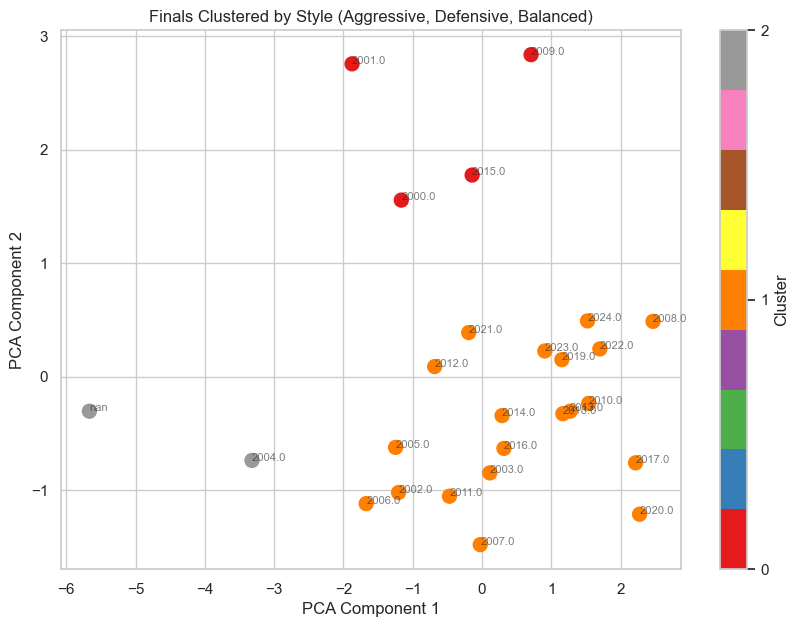

Cluster Centers (feature means):


,aggression_index_champion,serve_strength_champion,clutch_index_champion,aces_champion,df_champion
0,18.75,68.9375,0.775694,13.75,3.25
1,15.75,73.2750,0.804670,6.35,1.90
2,0.50,60.3750,0.574359,6.50,5.50


In [21]:
# --- Step 1: Feature Engineering for Clustering ---

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Feature engineering
df['aggression_index_champion'] = df['winners_champion'] - df['uf_errors_champion']
df['aggression_index_runner_up'] = df['winners_runner_up'] - df['uf_errors_runner_up']
df['serve_strength_champion'] = (df['first_serve_pct_champion'] * 0.5 +
                                 df['first_win_pct_champion'] * 0.25 +
                                 df['second_win_pct_champion'] * 0.25)
df['clutch_index_champion'] = df['break_saved_champion'].apply(
    lambda x: eval(str(x).replace(' ','')) if '/' in str(x) else 0)
df['clutch_index_champion'] = df['clutch_index_champion'].apply(
    lambda x: x[0]/x[1] if isinstance(x, tuple) or isinstance(x, list) else x)

# Select features for clustering (champion only for simplicity)
features = [
    'aggression_index_champion',
    'serve_strength_champion',
    'clutch_index_champion',
    'aces_champion',
    'df_champion'
]
X = df[features].replace([np.inf, -np.inf], np.nan).fillna(0)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster'] = kmeans.fit_predict(X_scaled)

# PCA for 2D visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10,7))
scatter = plt.scatter(X_pca[:,0], X_pca[:,1], c=df['cluster'], cmap='Set1', s=100)
plt.title('Finals Clustered by Style (Aggressive, Defensive, Balanced)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(scatter, ticks=[0,1,2], label='Cluster')
for i, txt in enumerate(df['year']):
    plt.annotate(txt, (X_pca[i,0], X_pca[i,1]), fontsize=8, alpha=0.6)
plt.show()

# Show cluster centers (in original feature space)
centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_summary = pd.DataFrame(centers, columns=features)
print('Cluster Centers (feature means):')
display(cluster_summary)

In [23]:
def parse_break_saved(val):
    try:
        if isinstance(val, str) and '/' in val:
            num, denom = val.replace(' ', '').split('/')
            return int(num)
        elif isinstance(val, (int, float)):
            return int(val)
        else:
            return 0
    except:
        return 0

def make_ml_rows(row):
    champ = {
        'winner': 1,
        'first_serve_pct': row['first_serve_pct_champion'],
        'first_win_pct': row['first_win_pct_champion'],
        'second_win_pct': row['second_win_pct_champion'],
        'aces': row['aces_champion'],
        'df': row['df_champion'],
        'winners': row['winners_champion'],
        'uf_errors': row['uf_errors_champion'],
        'break_saved': parse_break_saved(row['break_saved_champion']),
        'return_games': row['return_games_champion'],
        'total_points': row['tot_points_champion']
    }
    runner = {
        'winner': 0,
        'first_serve_pct': row['first_serve_pct_runner_up'],
        'first_win_pct': row['first_win_pct_runner_up'],
        'second_win_pct': row['second_win_pct_runner_up'],
        'aces': row['aces_runner_up'],
        'df': row['df_runner_up'],
        'winners': row['winners_runner_up'],
        'uf_errors': row['uf_errors_runner_up'],
        'break_saved': parse_break_saved(row['break_saved_runner_up']),
        'return_games': row['return_games_runner_up'],
        'total_points': row['tot_points_runner_up']
    }
    return [champ, runner]

ml_rows = []
for _, row in df.iterrows():
    ml_rows.extend(make_ml_rows(row))
ml_df = pd.DataFrame(ml_rows)

ml_df = ml_df.replace([np.inf, -np.inf], np.nan).dropna()
X = ml_df.drop('winner', axis=1)
y = ml_df['winner']

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print("Test accuracy:", accuracy_score(y_test, y_pred))

importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("Feature importances:")
display(importances)

Test accuracy: 0.9090909090909091
Feature importances:


return_games       0.287585
first_win_pct      0.193360
break_saved        0.132543
uf_errors          0.079695
total_points       0.074855
first_serve_pct    0.072425
second_win_pct     0.063545
winners            0.056607
df                 0.025161
aces               0.014223
dtype: float64

In [24]:
# Example: Create a sample draw with 8 players and their stats
players = [
    {'name': 'Carlos Alcaraz', 'first_serve_pct': 58, 'first_win_pct': 63, 'second_win_pct': 57, 'winners': 70, 'uf_errors': 73, 'break_saved': 8, 'return_games': 7},
    {'name': 'Jannik Sinner', 'first_serve_pct': 54, 'first_win_pct': 70, 'second_win_pct': 50, 'winners': 53, 'uf_errors': 64, 'break_saved': 7, 'return_games': 7},
    {'name': 'Novak Djokovic', 'first_serve_pct': 65, 'first_win_pct': 75, 'second_win_pct': 60, 'winners': 50, 'uf_errors': 40, 'break_saved': 8, 'return_games': 6},
    {'name': 'Alexander Zverev', 'first_serve_pct': 70, 'first_win_pct': 72, 'second_win_pct': 55, 'winners': 48, 'uf_errors': 50, 'break_saved': 7, 'return_games': 5},
    {'name': 'Casper Ruud', 'first_serve_pct': 68, 'first_win_pct': 68, 'second_win_pct': 58, 'winners': 45, 'uf_errors': 45, 'break_saved': 6, 'return_games': 5},
    {'name': 'Stefanos Tsitsipas', 'first_serve_pct': 66, 'first_win_pct': 70, 'second_win_pct': 54, 'winners': 47, 'uf_errors': 52, 'break_saved': 6, 'return_games': 5},
    {'name': 'Daniil Medvedev', 'first_serve_pct': 64, 'first_win_pct': 68, 'second_win_pct': 56, 'winners': 44, 'uf_errors': 48, 'break_saved': 5, 'return_games': 4},
    {'name': 'Holger Rune', 'first_serve_pct': 62, 'first_win_pct': 67, 'second_win_pct': 53, 'winners': 46, 'uf_errors': 49, 'break_saved': 5, 'return_games': 4},
]
import pandas as pd
draw_df = pd.DataFrame(players)

In [25]:
import numpy as np

def match_win_prob(player1, player2):
    # Simple model: combine serve, return, aggression, clutch
    p1_score = (
        player1['first_serve_pct'] * 0.2 +
        player1['first_win_pct'] * 0.2 +
        player1['second_win_pct'] * 0.1 +
        (player1['winners'] - player1['uf_errors']) * 0.2 +
        player1['break_saved'] * 0.1 +
        player1['return_games'] * 0.2
    )
    p2_score = (
        player2['first_serve_pct'] * 0.2 +
        player2['first_win_pct'] * 0.2 +
        player2['second_win_pct'] * 0.1 +
        (player2['winners'] - player2['uf_errors']) * 0.2 +
        player2['break_saved'] * 0.1 +
        player2['return_games'] * 0.2
    )
    prob = 1 / (1 + np.exp(-(p1_score - p2_score)/10))  # logistic
    return prob

def simulate_match(player1, player2):
    prob = match_win_prob(player1, player2)
    return player1['name'] if np.random.rand() < prob else player2['name']

In [26]:
def simulate_tournament(draw_df):
    players = draw_df.copy()
    np.random.shuffle(players.values)
    while len(players) > 1:
        winners = []
        for i in range(0, len(players), 2):
            p1 = players.iloc[i]
            p2 = players.iloc[i+1]
            winner = simulate_match(p1, p2)
            winners.append(draw_df[draw_df['name'] == winner].iloc[0])
        players = pd.DataFrame(winners)
    return players.iloc[0]['name']

# Run Monte Carlo simulation
results = []
for _ in range(10000):
    winner = simulate_tournament(draw_df)
    results.append(winner)
win_counts = pd.Series(results).value_counts(normalize=True) * 100
print("Win probabilities (%):")
print(win_counts)

Win probabilities (%):
Novak Djokovic        23.07
Casper Ruud           15.24
Alexander Zverev      14.26
Stefanos Tsitsipas    11.76
Daniil Medvedev       10.53
Carlos Alcaraz         9.40
Holger Rune            9.20
Jannik Sinner          6.54
Name: proportion, dtype: float64


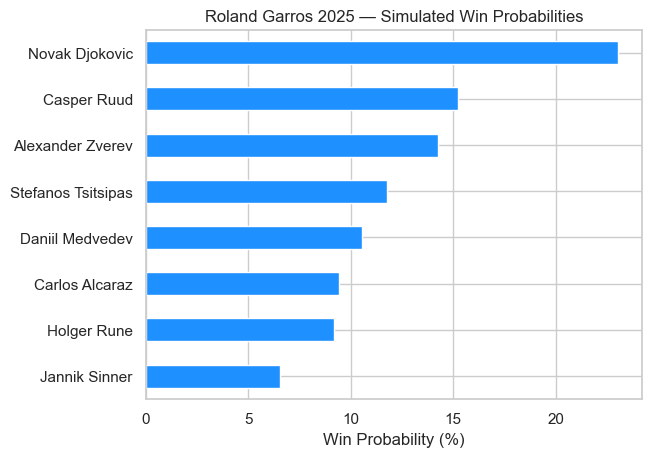

In [27]:
import matplotlib.pyplot as plt

win_counts.sort_values().plot(kind='barh', color='dodgerblue')
plt.title('Roland Garros 2025 — Simulated Win Probabilities')
plt.xlabel('Win Probability (%)')
plt.show()

In [28]:
import numpy as np
import pandas as pd

# Simulate a 5-set final with 300 points (for demo)
np.random.seed(42)
points = 300
# Let's say Alcaraz wins 51% of points, Sinner 49%
alcaraz_win = np.random.choice([1, 0], size=points, p=[0.51, 0.49])
sinner_win = 1 - alcaraz_win

# Cumulative points
alcaraz_cum = np.cumsum(alcaraz_win)
sinner_cum = np.cumsum(sinner_win)

# Win probability (toy model: based on current point lead)
win_prob = 0.5 + (alcaraz_cum - sinner_cum) / (2 * points)
win_prob = np.clip(win_prob, 0, 1)

df_dyn = pd.DataFrame({
    'Point': np.arange(1, points+1),
    'Alcaraz_cum': alcaraz_cum,
    'Sinner_cum': sinner_cum,
    'Alcaraz_win_prob': win_prob
})

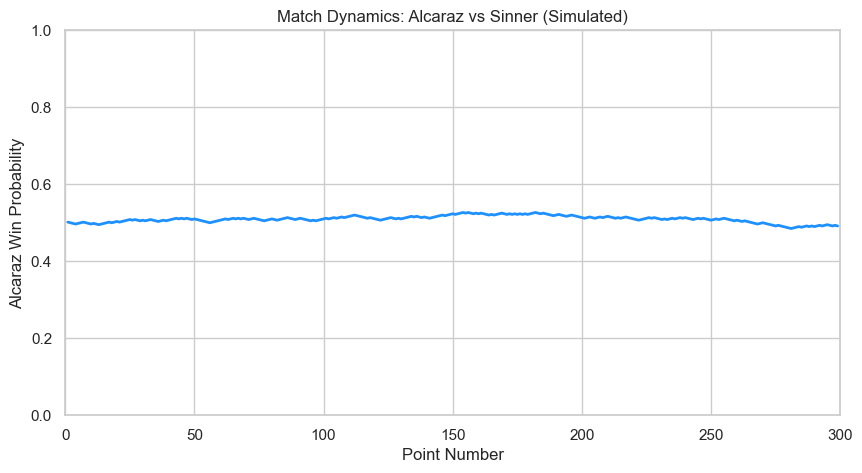

In [29]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(10,5))
ax.set_xlim(0, points)
ax.set_ylim(0, 1)
line, = ax.plot([], [], lw=2, color='dodgerblue')
ax.set_title('Match Dynamics: Alcaraz vs Sinner (Simulated)')
ax.set_xlabel('Point Number')
ax.set_ylabel('Alcaraz Win Probability')

def init():
    line.set_data([], [])
    return line,

def update(frame):
    x = df_dyn['Point'][:frame]
    y = df_dyn['Alcaraz_win_prob'][:frame]
    line.set_data(x, y)
    return line,

anim = FuncAnimation(fig, update, frames=points, init_func=init, blit=True, interval=20)

HTML(anim.to_jshtml())


In [30]:
import pandas as pd

# Use the last N unique players from your finals data as a sample draw
players = pd.unique(df[['champion', 'runner_up']].values.ravel())
# For demo, let's use the last 8 unique players (you can expand to 16, 32, etc.)
draw_players = players[-8:]

# Build a DataFrame of player stats (using their most recent final appearance)
draw_df = []
for player in draw_players:
    # Get the most recent row where this player was champion or runner-up
    row = df[(df['champion'] == player) | (df['runner_up'] == player)].iloc[-1]
    if row['champion'] == player:
        stats = {
            'name': player,
            'first_serve_pct': row['first_serve_pct_champion'],
            'first_win_pct': row['first_win_pct_champion'],
            'second_win_pct': row['second_win_pct_champion'],
            'winners': row['winners_champion'],
            'uf_errors': row['uf_errors_champion'],
            'break_saved': int(str(row['break_saved_champion']).split('/')[0]) if '/' in str(row['break_saved_champion']) else 0,
            'return_games': row['return_games_champion']
        }
    else:
        stats = {
            'name': player,
            'first_serve_pct': row['first_serve_pct_runner_up'],
            'first_win_pct': row['first_win_pct_runner_up'],
            'second_win_pct': row['second_win_pct_runner_up'],
            'winners': row['winners_runner_up'],
            'uf_errors': row['uf_errors_runner_up'],
            'break_saved': int(str(row['break_saved_runner_up']).split('/')[0]) if '/' in str(row['break_saved_runner_up']) else 0,
            'return_games': row['return_games_runner_up']
        }
    draw_df.append(stats)
draw_df = pd.DataFrame(draw_df)

In [31]:
import numpy as np

def match_win_prob(player1, player2):
    # Simple model: combine serve, return, aggression, clutch
    p1_score = (
        player1['first_serve_pct'] * 0.2 +
        player1['first_win_pct'] * 0.2 +
        player1['second_win_pct'] * 0.1 +
        (player1['winners'] - player1['uf_errors']) * 0.2 +
        player1['break_saved'] * 0.1 +
        player1['return_games'] * 0.2
    )
    p2_score = (
        player2['first_serve_pct'] * 0.2 +
        player2['first_win_pct'] * 0.2 +
        player2['second_win_pct'] * 0.1 +
        (player2['winners'] - player2['uf_errors']) * 0.2 +
        player2['break_saved'] * 0.1 +
        player2['return_games'] * 0.2
    )
    prob = 1 / (1 + np.exp(-(p1_score - p2_score)/10))  # logistic
    return prob

def simulate_match(player1, player2):
    prob = match_win_prob(player1, player2)
    return player1['name'] if np.random.rand() < prob else player2['name']

In [32]:
def simulate_tournament(draw_df):
    players = draw_df.copy()
    players = players.sample(frac=1).reset_index(drop=True)  # Shuffle
    while len(players) > 1:
        winners = []
        for i in range(0, len(players), 2):
            p1 = players.iloc[i]
            p2 = players.iloc[i+1]
            winner = simulate_match(p1, p2)
            winners.append(draw_df[draw_df['name'] == winner].iloc[0])
        players = pd.DataFrame(winners)
    return players.iloc[0]['name']

# Run Monte Carlo simulation
results = []
for _ in range(10000):
    winner = simulate_tournament(draw_df)
    results.append(winner)
win_counts = pd.Series(results).value_counts(normalize=True) * 100
print("Win probabilities (%):")
print(win_counts)

Win probabilities (%):
Dominic Thiem         17.09
Stefanos Tsitsipas    16.94
Alexander Zverev      15.75
Casper Ruud           15.36
Stan Wawrinka         13.74
Andy Murray           11.02
Carlos Alcaraz         5.57
Jannik Sinner          4.53
Name: proportion, dtype: float64


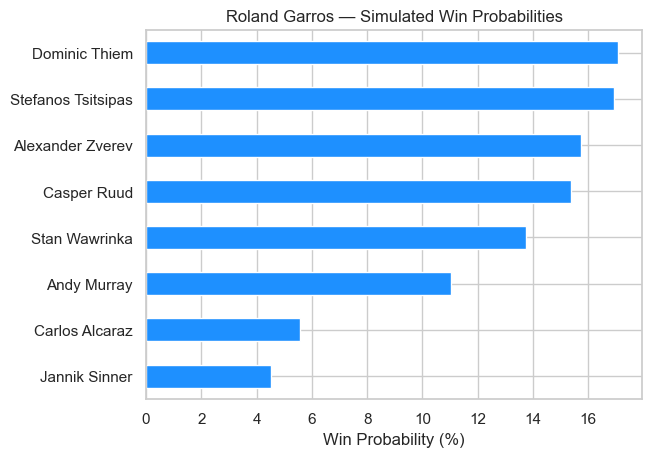

In [33]:
import matplotlib.pyplot as plt

win_counts.sort_values().plot(kind='barh', color='dodgerblue')
plt.title('Roland Garros — Simulated Win Probabilities')
plt.xlabel('Win Probability (%)')
plt.show()

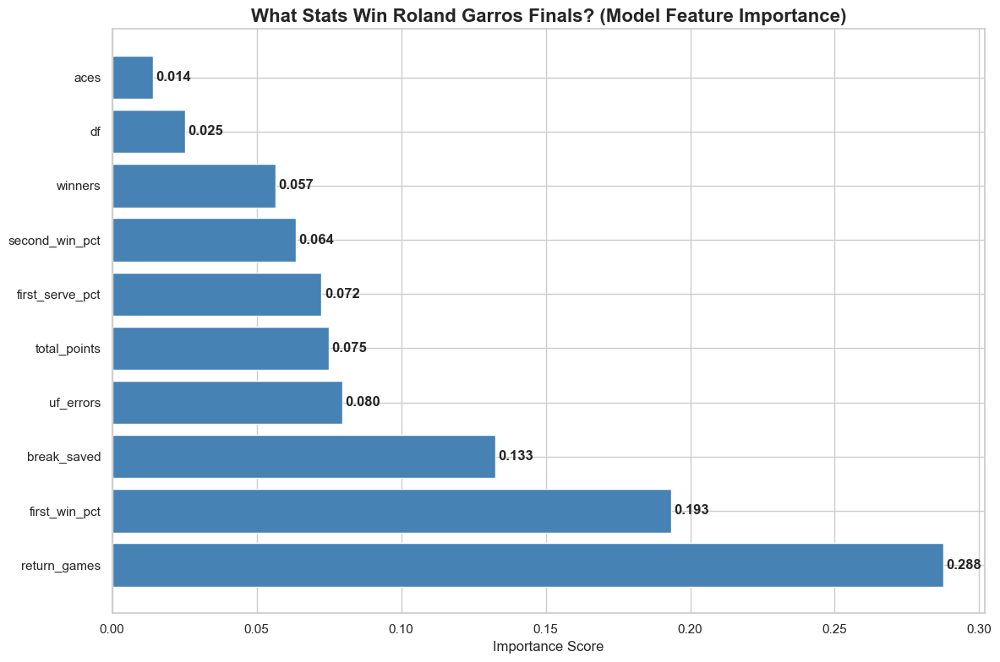

Top 5 Most Important Features for Winning Finals:
1. return_games: 0.288
2. first_win_pct: 0.193
3. break_saved: 0.133
4. uf_errors: 0.080
5. total_points: 0.075


In [55]:
# Get feature importances from your RandomForest model
importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(12, 8))
bars = plt.barh(importances.index, importances.values, color='steelblue')
plt.title('What Stats Win Roland Garros Finals? (Model Feature Importance)', fontsize=16, fontweight='bold')
plt.xlabel('Importance Score')

# Add value labels on bars
for i, bar in enumerate(bars):
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height()/2, 
             f'{width:.3f}', ha='left', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

print("Top 5 Most Important Features for Winning Finals:")
for i, (feature, importance) in enumerate(importances.head().items(), 1):
    print(f"{i}. {feature}: {importance:.3f}")

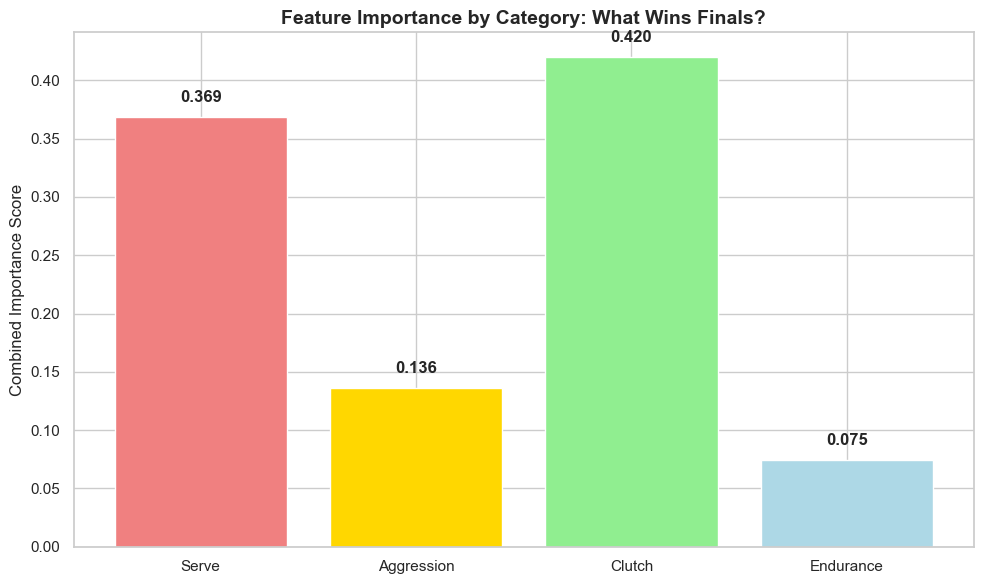

In [56]:
# Group features by category for better insights
feature_categories = {
    'Serve': ['first_serve_pct', 'first_win_pct', 'second_win_pct', 'aces', 'df'],
    'Aggression': ['winners', 'uf_errors'],
    'Clutch': ['break_saved', 'return_games'],
    'Endurance': ['total_points']
}

category_importance = {}
for category, features in feature_categories.items():
    category_features = [f for f in features if f in importances.index]
    category_importance[category] = importances[category_features].sum()

# Plot category importance
plt.figure(figsize=(10, 6))
categories = list(category_importance.keys())
values = list(category_importance.values())
bars = plt.bar(categories, values, color=['lightcoral', 'gold', 'lightgreen', 'lightblue'])
plt.title('Feature Importance by Category: What Wins Finals?', fontsize=14, fontweight='bold')
plt.ylabel('Combined Importance Score')

# Add value labels
for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
             f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

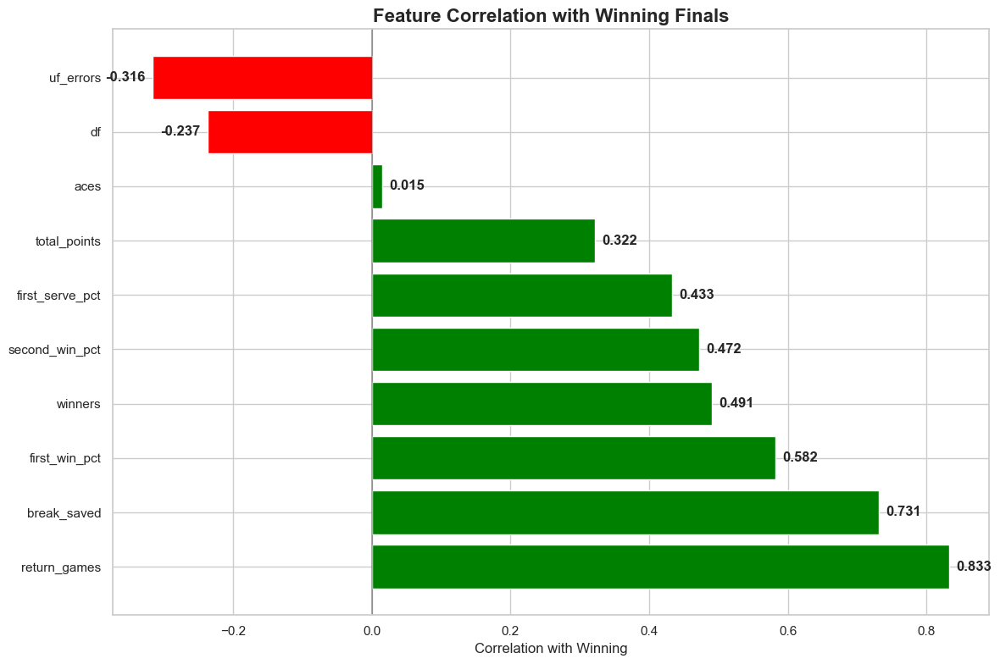

In [57]:
# Analyze correlation between features and winning
correlation_with_winning = X.corrwith(y).sort_values(ascending=False)

plt.figure(figsize=(12, 8))
colors = ['green' if x > 0 else 'red' for x in correlation_with_winning.values]
bars = plt.barh(correlation_with_winning.index, correlation_with_winning.values, color=colors)
plt.title('Feature Correlation with Winning Finals', fontsize=16, fontweight='bold')
plt.xlabel('Correlation with Winning')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)

# Add value labels
for i, bar in enumerate(bars):
    width = bar.get_width()
    plt.text(width + (0.01 if width > 0 else -0.01), bar.get_y() + bar.get_height()/2, 
             f'{width:.3f}', ha='left' if width > 0 else 'right', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

In [58]:
# Explain a specific prediction manually (e.g., 2025 final)
def explain_prediction(model, features, feature_names, player_name="Player"):
    prediction = model.predict_proba([features])[0]
    
    print(f"\n🎾 Prediction Explanation for {player_name}")
    print("=" * 50)
    print(f"Win Probability: {prediction[1]:.1%}")
    print(f"Lose Probability: {prediction[0]:.1%}")
    print("\nKey Contributing Factors:")
    
    # Get feature importances
    importances = model.feature_importances_
    
    # Calculate contribution (simplified)
    contributions = []
    for i, (feature, value, importance) in enumerate(zip(feature_names, features, importances)):
        contribution = value * importance
        contributions.append((feature, value, importance, contribution))
    
    # Sort by contribution
    contributions.sort(key=lambda x: abs(x[3]), reverse=True)
    
    for i, (feature, value, importance, contribution) in enumerate(contributions[:5], 1):
        print(f"{i}. {feature}: {value:.1f} (importance: {importance:.3f})")

# Example: Explain 2025 final champion (Alcaraz)
if len(X) > 0:
    # Get the last row (most recent data)
    last_row = X.iloc[-1]
    explain_prediction(rf, last_row.values, X.columns, "2025 Champion")


🎾 Prediction Explanation for 2025 Champion
Win Probability: 25.0%
Lose Probability: 75.0%

Key Contributing Factors:
1. total_points: 193.0 (importance: 0.075)
2. first_win_pct: 70.0 (importance: 0.193)
3. uf_errors: 64.0 (importance: 0.080)
4. first_serve_pct: 54.0 (importance: 0.072)
5. second_win_pct: 50.0 (importance: 0.064)


c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


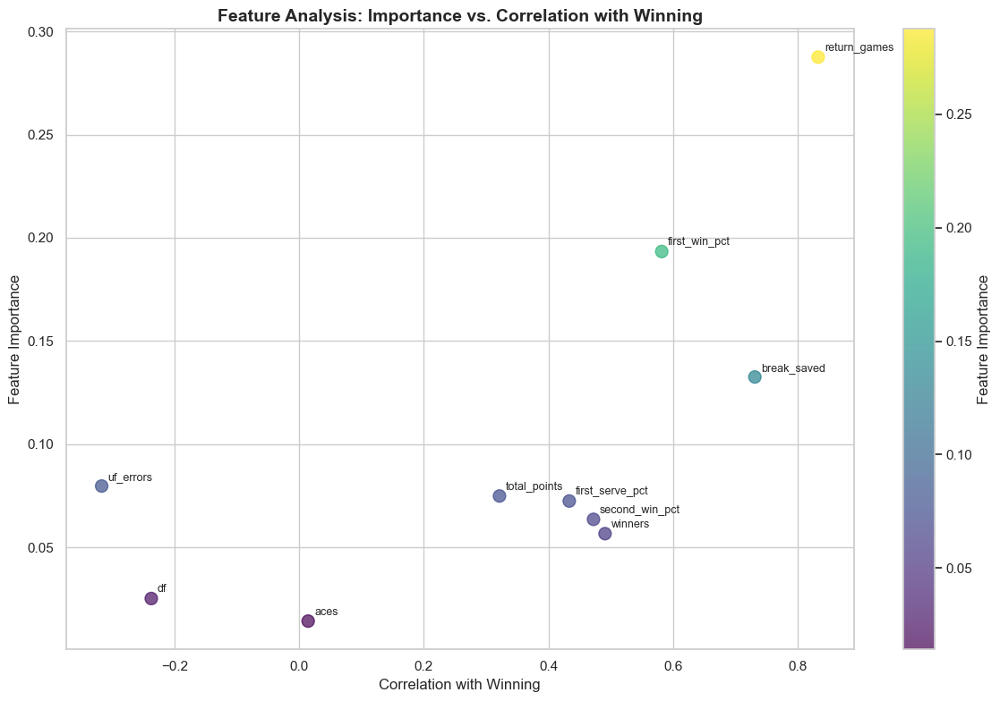

In [59]:
# Create a heatmap of feature importance vs. correlation
import seaborn as sns

# Combine importance and correlation data
analysis_df = pd.DataFrame({
    'Feature': importances.index,
    'Importance': importances.values,
    'Correlation': [correlation_with_winning[f] for f in importances.index]
})

plt.figure(figsize=(12, 8))
scatter = plt.scatter(analysis_df['Correlation'], analysis_df['Importance'], 
                     s=100, alpha=0.7, c=analysis_df['Importance'], cmap='viridis')
plt.xlabel('Correlation with Winning')
plt.ylabel('Feature Importance')
plt.title('Feature Analysis: Importance vs. Correlation with Winning', fontsize=14, fontweight='bold')

# Add feature labels
for i, row in analysis_df.iterrows():
    plt.annotate(row['Feature'], (row['Correlation'], row['Importance']), 
                xytext=(5, 5), textcoords='offset points', fontsize=9)

plt.colorbar(scatter, label='Feature Importance')
plt.tight_layout()
plt.show()

In [60]:
# Get all unique finalists from 2000-2025
all_finalists = list(set(df['champion'].tolist() + df['runner_up'].tolist()))
print(f"Total finalists: {len(all_finalists)}")

# Create player profiles (using their best/most recent final stats)
def get_player_profile(player_name):
    # Get all finals this player appeared in
    player_finals = df[(df['champion'] == player_name) | (df['runner_up'] == player_name)]
    
    # Use their championship performance if available, otherwise their best runner-up performance
    if len(player_finals[player_finals['champion'] == player_name]) > 0:
        best_final = player_finals[player_finals['champion'] == player_name].iloc[-1]
        is_champion = True
    else:
        best_final = player_finals.iloc[-1]
        is_champion = False
    
    if is_champion:
        return {
            'name': player_name,
            'first_serve_pct': best_final['first_serve_pct_champion'],
            'first_win_pct': best_final['first_win_pct_champion'],
            'second_win_pct': best_final['second_win_pct_champion'],
            'winners': best_final['winners_champion'],
            'uf_errors': best_final['uf_errors_champion'],
            'aces': best_final['aces_champion'],
            'return_games': best_final['return_games_champion']
        }
    else:
        return {
            'name': player_name,
            'first_serve_pct': best_final['first_serve_pct_runner_up'],
            'first_win_pct': best_final['first_win_pct_runner_up'],
            'second_win_pct': best_final['second_win_pct_runner_up'],
            'winners': best_final['winners_runner_up'],
            'uf_errors': best_final['uf_errors_runner_up'],
            'aces': best_final['aces_runner_up'],
            'return_games': best_final['return_games_runner_up']
        }

# Create profiles for all finalists
finalist_profiles = [get_player_profile(player) for player in all_finalists]

Total finalists: 22


In [61]:
import numpy as np
from itertools import combinations

def simulate_head_to_head(player1, player2, num_simulations=1000):
    """Simulate matches between two players"""
    wins_p1 = 0
    
    for _ in range(num_simulations):
        # Calculate match probability based on stats
        p1_score = (
            player1['first_serve_pct'] * 0.2 +
            player1['first_win_pct'] * 0.2 +
            player1['second_win_pct'] * 0.15 +
            (player1['winners'] - player1['uf_errors']) * 0.15 +
            player1['aces'] * 0.1 +
            player1['return_games'] * 0.2
        )
        
        p2_score = (
            player2['first_serve_pct'] * 0.2 +
            player2['first_win_pct'] * 0.2 +
            player2['second_win_pct'] * 0.15 +
            (player2['winners'] - player2['uf_errors']) * 0.15 +
            player2['aces'] * 0.1 +
            player2['return_games'] * 0.2
        )
        
        prob_p1_wins = 1 / (1 + np.exp(-(p1_score - p2_score) / 10))
        
        if np.random.random() < prob_p1_wins:
            wins_p1 += 1
    
    return wins_p1 / num_simulations

# Create round robin results matrix
print("🎾 Simulating ULTIMATE FINALS SHOWDOWN...")
print("Every finalist vs every other finalist!")

results_matrix = np.zeros((len(all_finalists), len(all_finalists)))
win_percentages = {}

for i, player1 in enumerate(all_finalists):
    win_percentages[player1] = 0
    for j, player2 in enumerate(all_finalists):
        if i != j:
            profile1 = finalist_profiles[i]
            profile2 = finalist_profiles[j]
            win_rate = simulate_head_to_head(profile1, profile2)
            results_matrix[i][j] = win_rate
            win_percentages[player1] += win_rate

# Calculate overall win rates
for player in win_percentages:
    win_percentages[player] = win_percentages[player] / (len(all_finalists) - 1) * 100

# Sort by overall win rate
sorted_players = sorted(win_percentages.items(), key=lambda x: x[1], reverse=True)

🎾 Simulating ULTIMATE FINALS SHOWDOWN...
Every finalist vs every other finalist!



🏆 ULTIMATE FINALS CHAMPION RANKING
If every finalist played every other finalist 1000 times each...

 1. Rafael Nadal          70.4% overall win rate
 2. Novak Djokovic        66.9% overall win rate
 3. Roger Federer         65.0% overall win rate
 4. Stan Wawrinka         63.7% overall win rate
 5. Gustavo Kuerten       60.6% overall win rate
 6. Juan Carlos Ferrero   56.8% overall win rate
 7. Dominic Thiem         53.4% overall win rate
 8. Stefanos Tsitsipas    53.0% overall win rate
 9. Alexander Zverev      52.8% overall win rate
10. Casper Ruud           51.9% overall win rate


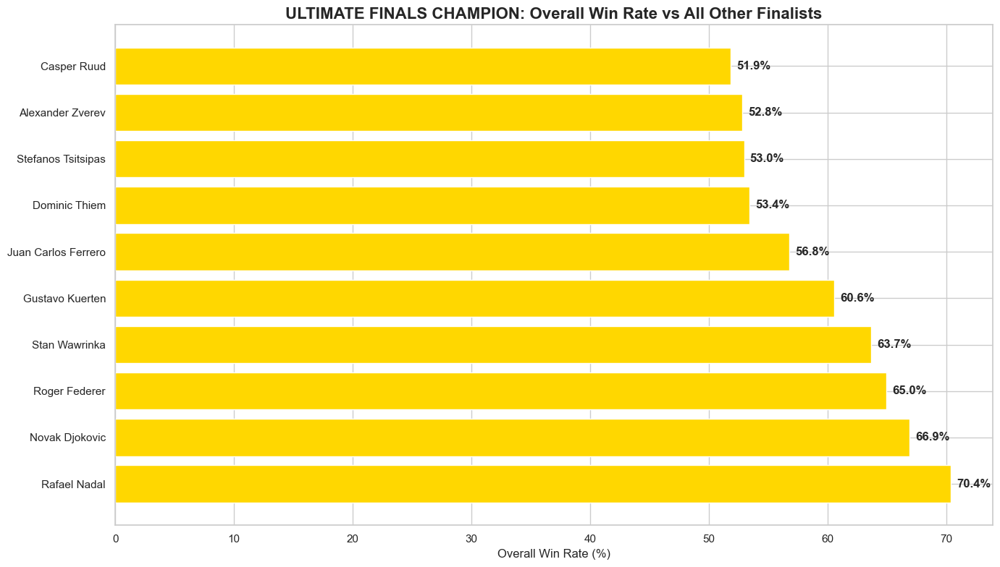

In [64]:
# Create the ultimate ranking
print("\n🏆 ULTIMATE FINALS CHAMPION RANKING")
print("=" * 60)
print("If every finalist played every other finalist 1000 times each...")
print()

for i, (player, win_rate) in enumerate(sorted_players[:10], 1):
    print(f"{i:2d}. {player:<20} {win_rate:5.1f}% overall win rate")

# Visualize top 10
plt.figure(figsize=(14, 8))
top_10_players = [player for player, _ in sorted_players[:10]]
top_10_rates = [rate for _, rate in sorted_players[:10]]

bars = plt.barh(top_10_players, top_10_rates, color='gold')
plt.title('ULTIMATE FINALS CHAMPION: Overall Win Rate vs All Other Finalists', 
          fontsize=16, fontweight='bold')
plt.xlabel('Overall Win Rate (%)')

# Add value labels
for bar, rate in zip(bars, top_10_rates):
    plt.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2, 
             f'{rate:.1f}%', ha='left', va='center', fontweight='bold')

plt.tight_layout()
plt.show()